# CellMap for pancreas endocrine cell data

The tutorial for pancreas endocrine cell data ([Bastidas et al., 2019](https://doi.org/10.1242/dev.173849)).

# Input & preprpcessing

In [1]:
import cellmap
import numpy as np
import scanpy

The dataset is installed using the [scvelo](https://scvelo.readthedocs.io/en/stable/) package. 

In [2]:
import scvelo as scv
adata = scv.datasets.pancreas()
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score'
    var: 'highly_variable_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

## Noise reduction by [RECODE](https://github.com/yusuke-imoto-lab/RECODE).

start RECODE for scRNA-seq data
end RECODE for scRNA-seq
log: {'seq_target': 'RNA', '#significant genes': 10602, '#non-significant genes': 7148, '#silent genes': 10248, 'ell': 100, 'Elapsed time': '0h 0m 12s 710ms', 'solver': 'full'}


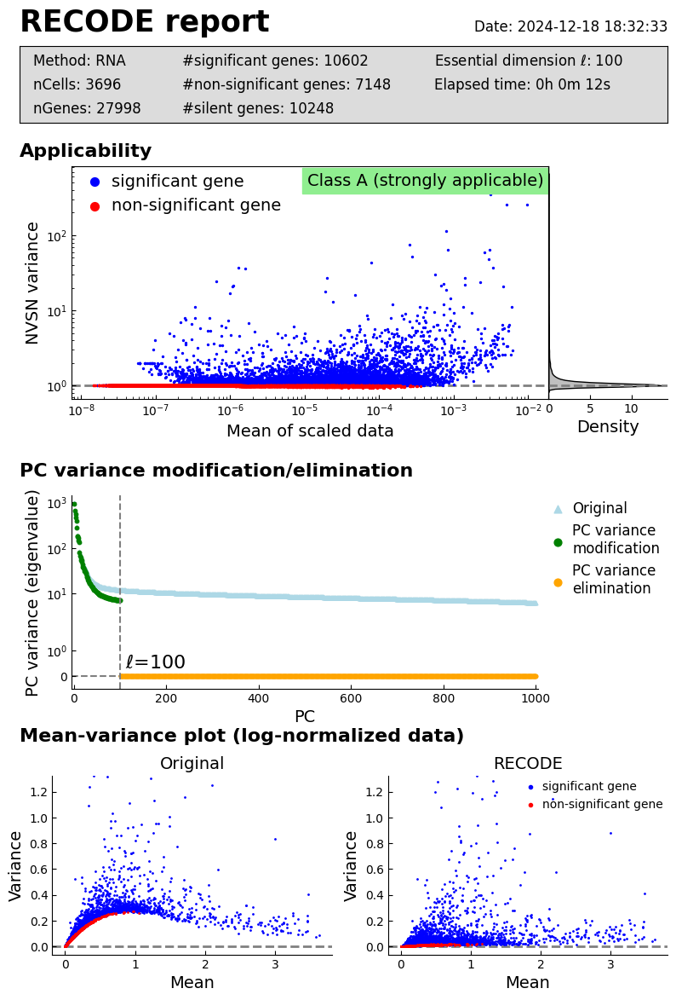

In [3]:
import screcode
recode = screcode.RECODE()
adata.layers['RECODE'] = recode.fit_transform(adata.X.toarray())
adata.layers['RECODE_log'] = np.log(1e4*adata.layers['RECODE'].T/np.sum(adata.layers['RECODE'],axis=1)+1).T
recode.report()

## Log transformtaion

In [4]:
scanpy.pp.normalize_total(adata, target_sum=1e4)
scanpy.pp.log1p(adata)

## RNA velocity

In [5]:
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)
scv.tl.velocity(adata,mode='stochastic')
scv.tl.velocity_graph(adata,n_jobs=4)

Normalized count data: spliced, unspliced.
Logarithmized X.
computing neighbors


/home/yusuke/.local/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning:

`log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.

/tmp/ipykernel_15628/2319517749.py:2: DeprecationWarning:

Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning:

`neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.



    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:03) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities


/home/yusuke/.local/lib/python3.10/site-packages/scvelo/tools/optimization.py:184: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 4/8 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:00:18) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [6]:
adata

AnnData object with n_obs × n_vars = 3696 × 27998
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'highly_variable_genes', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca', 'log1p', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_umap'
    layers: 'spliced', 'unspliced', 'RECODE', 'RECODE_log', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWar

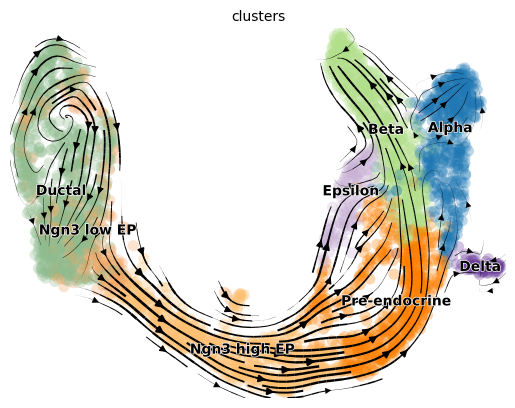

In [7]:
scv.pl.velocity_embedding_stream(adata,basis="umap")

# Hodge decomposition

In [8]:
cellmap.Hodge_decomposition(adata)#,graph_method='Delauney'

{'Contribution_ratio': {'Potential': '44.62%', 'Rotation': '55.38%'}}


## View flows

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/home/yusuke/.local/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWar

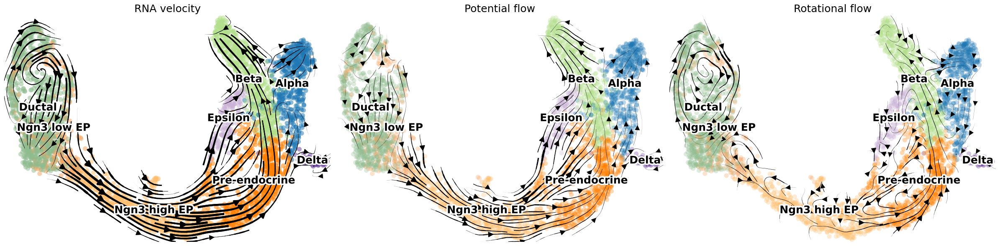

In [9]:
cellmap.view_stream(adata)

## View orbits

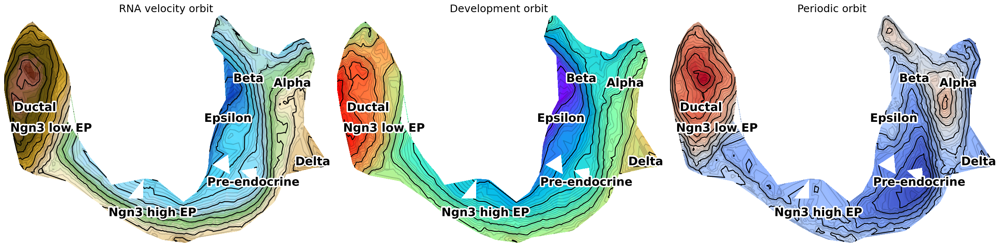

In [10]:
cellmap.view_stream_line(adata)

## View Hodge potential

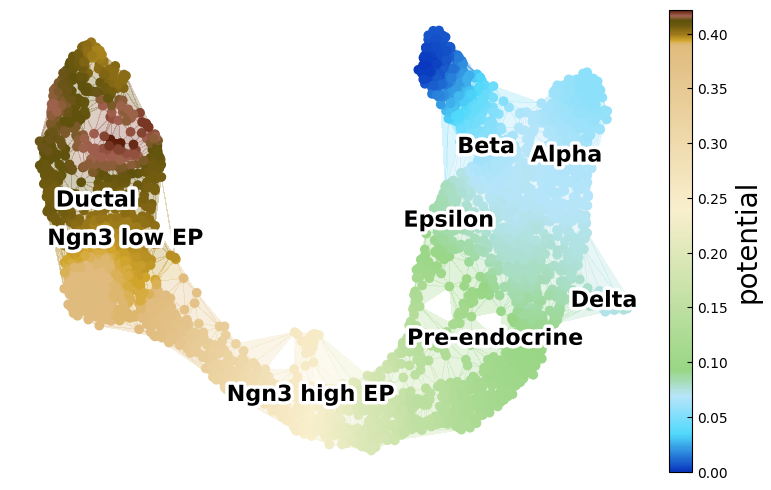

In [11]:
cellmap.view(adata,show_graph = True,cluster_key = 'clusters')

## View Hodge potential 3D

In [12]:
cellmap.view_3D(adata,cluster_key ='clusters',elev=50,azim=65)

## Write for [CellMap viewer](https://github.com/yusuke-imoto-lab/CellMapViewer). 

In [13]:
cellmap.write(adata,filename='CellMap_tutorial_pancreas',exp_key='RECODE_log')

succeeded in writing CellMapp data as "CellMap_tutorial_pancreas.csv"
You can visualize the CDV file by CellMapp viewer https://yusuke-imoto-lab.github.io/CellMapViewer/CellMapViewer/viewer.html


,X,Y,Potential,Annotation,Rotation,Streamline_Original,Streamline_Potential,Streamline_Rotation,Vorticity_Original,Vorticity_Potential,...,HVG_Gcg,HVG_Ghrl,HVG_Ins2,HVG_Ins1,HVG_Nnat,HVG_Iapp,HVG_Neurog3,HVG_Slc38a5,HVG_Cyr61,HVG_Pyy
CellID,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGAGGGATA,6.143066,-0.063644,0.079565,Pre-endocrine,1.464163e-16,2.674573,2.674573,1.305486,-1.358709,-1.358709,...,0.000000,0.226971,0.000000,0.555161,0.000000,0.000000,0.521635,0.000000,1.267550,5.333463
AAACCTGAGCCTTGAT,-9.906417,0.197778,0.391963,Ductal,3.659147e-16,4.027313,4.027313,1.911373,0.504180,0.504180,...,0.420802,0.926684,0.000000,0.537934,0.000000,0.932452,1.305424,0.000000,1.705200,0.000000
AAACCTGAGGCAATTA,7.559791,0.583762,0.073699,Alpha,1.144790e-18,3.169877,3.169877,1.241085,0.377923,0.377923,...,0.164565,0.000000,0.978078,0.340001,2.122325,4.200351,0.000000,0.000000,0.000000,3.500336
AAACCTGCATCATCCC,-11.283765,4.218998,0.411691,Ductal,-3.433463e-16,4.411959,4.411959,2.817108,-1.799784,-1.799784,...,0.000000,0.000000,0.751254,0.649183,0.000000,0.000000,0.000000,0.620625,2.256371,0.951630
AAACCTGGTAAGTGGC,1.721565,-4.753407,0.151628,Ngn3 high EP,-1.139032e-16,2.909854,2.909854,0.983169,-3.125582,-3.125582,...,0.137411,0.000000,0.219785,0.347281,1.463583,0.000000,3.360152,0.000000,0.000000,0.143055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGTGACATA,4.768472,-1.388353,0.091543,Pre-endocrine,1.696713e-16,1.677581,1.677581,0.000000,3.493445,3.493445,...,0.052442,0.243356,0.661314,0.686810,1.221565,1.509209,2.744263,1.569988,0.000000,0.078198
TTTGTCAAGTGTGGCA,-1.873335,-4.182650,0.230704,Ngn3 high EP,-1.538353e-16,2.205721,2.205721,0.924782,-0.350818,-0.350818,...,0.000000,0.477892,0.000000,0.000000,0.588606,0.000000,3.966237,0.814867,0.000000,0.852372
TTTGTCAGTTGTTTGG,-9.882250,-0.105594,0.390472,Ductal,-3.465670e-16,3.875671,3.875671,1.752118,1.109066,1.109066,...,0.052037,0.633711,1.078762,0.000000,0.000000,0.000000,0.473479,0.908228,2.297742,0.000000


# Dynamical analysis

## Single-cell trajectory

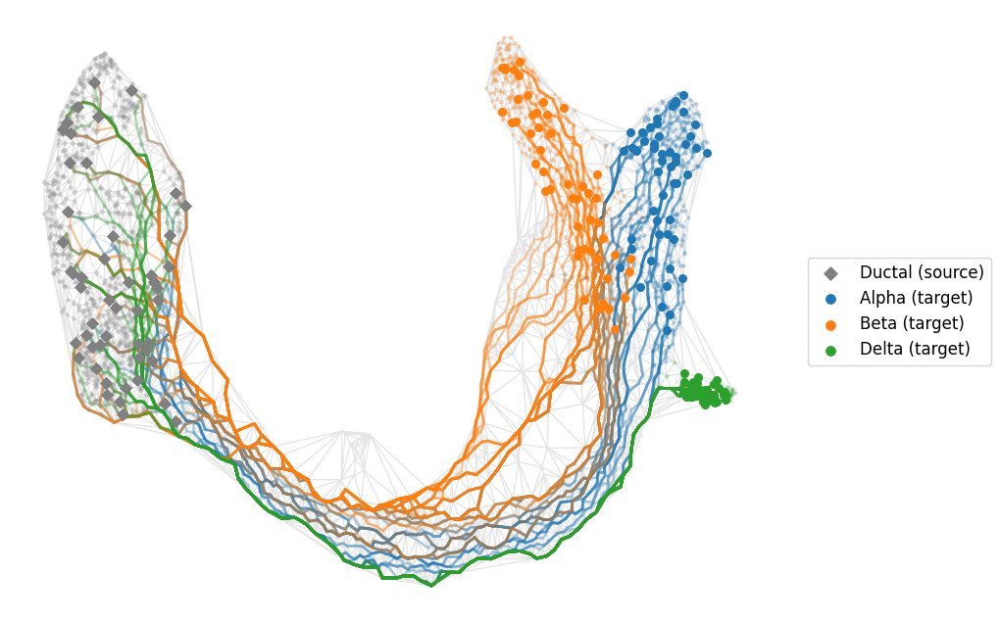

In [14]:
source_cluster = 'Ductal'
target_clusters = ['Alpha','Beta','Delta']
cellmap.view_trajectory(adata,source_cluster,target_clusters,weight_rate=0.9,graph_method="Delauney")

## Gene expression dynamics

In [16]:
cellmap.calc_dynamics(adata,source_cluster,target_clusters,exp_key='RECODE_log')

Done the computation of dynamics


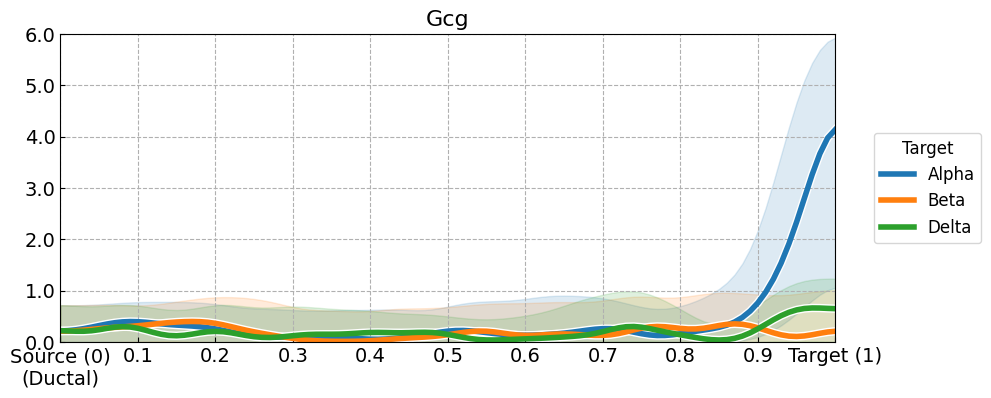

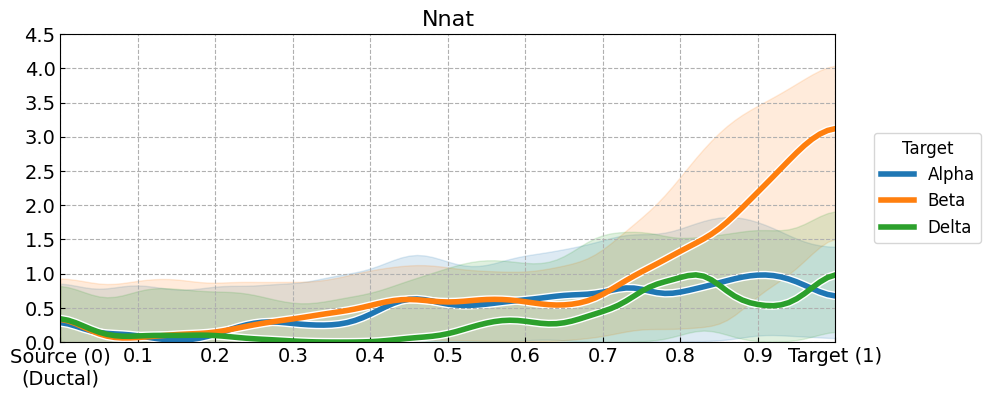

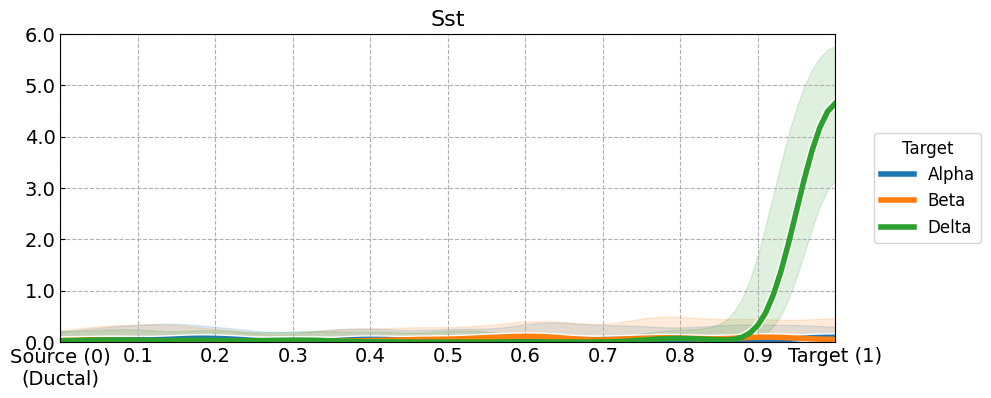

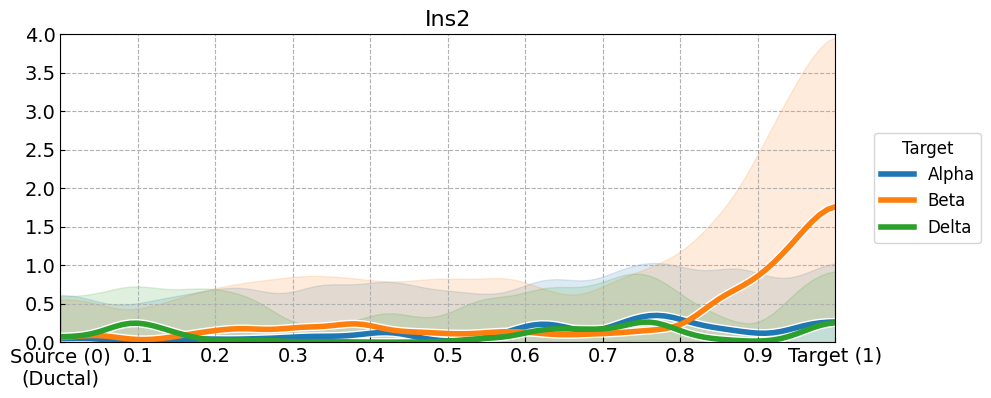

In [18]:
genes = ['Gcg','Nnat','Sst','Ins2'] 
cellmap.gene_dynamics_plot(adata,source_cluster,target_clusters,genes,exp_key='RECODE_log')

## Bifurcation diagram

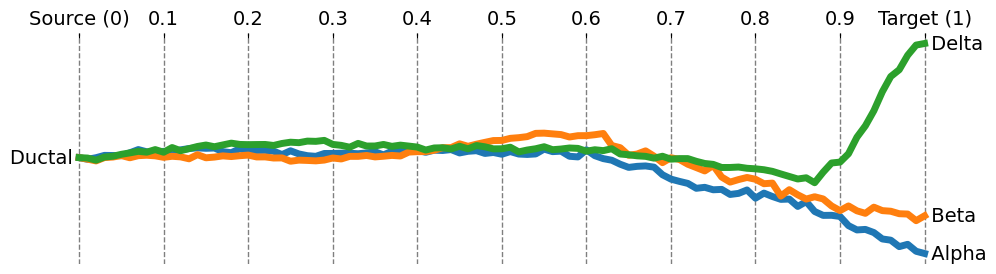

In [21]:
cellmap.bifurcation_diagram(adata,source_cluster,target_clusters)

## Landscape

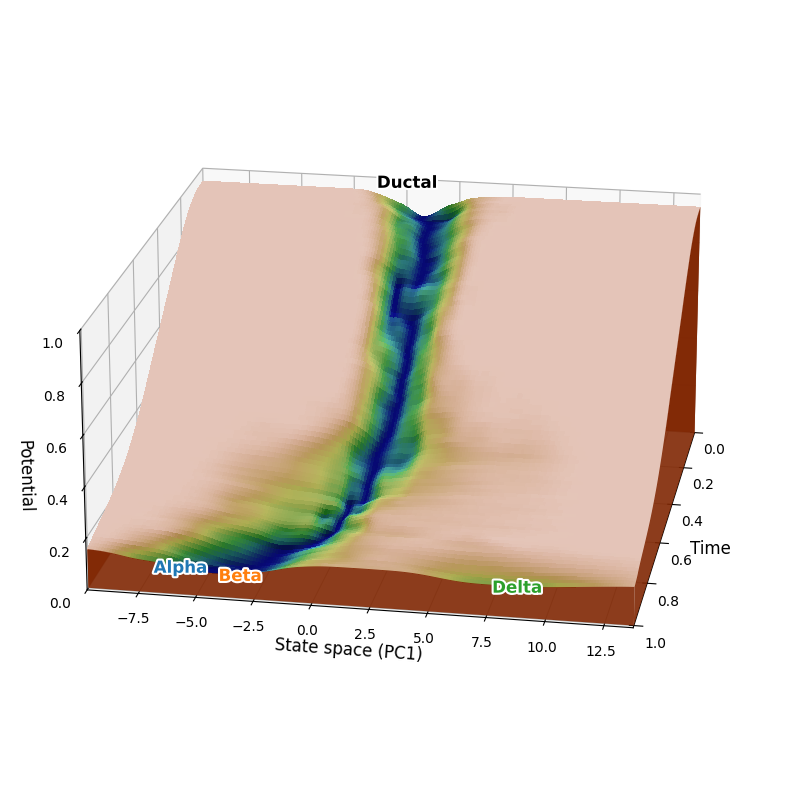

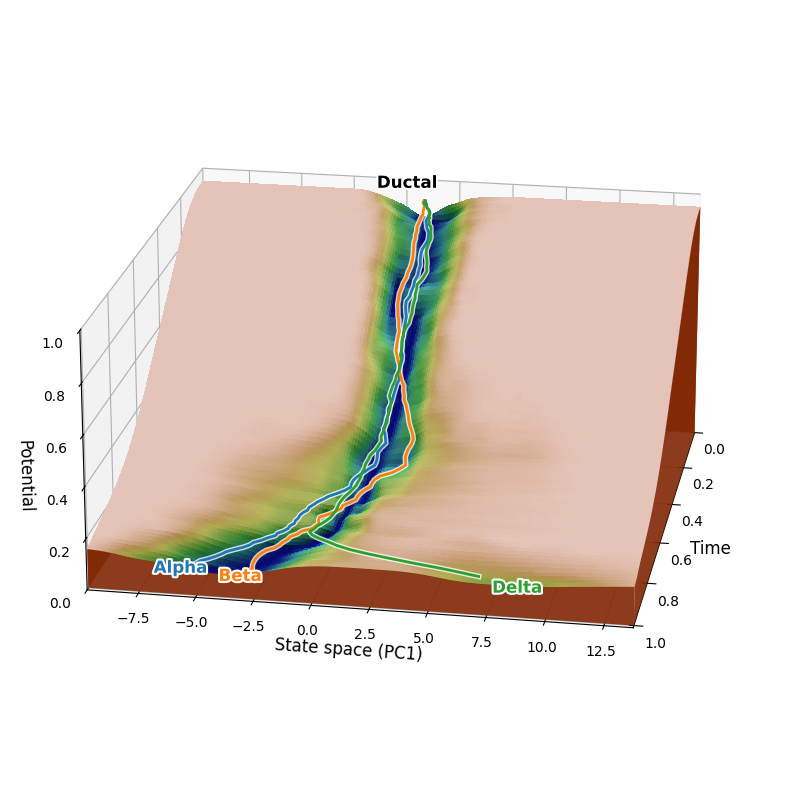

In [19]:
cellmap.landscape(adata,source_cluster,target_clusters,exp_key='RECODE_log')
cellmap.landscape(adata,source_cluster,target_clusters,exp_key='RECODE_log',plot_path = True)

## DEG dynamics

In [ ]:
cellmap.DEG_dynamics(adata,source_cluster,target_clusters,exp_key='RECODE_log',
                     show=False,save=True,
                     save_dir="output",save_filename="DEG_dynamics_pancreas")

MovieWriter ffmpeg unavailable; using Pillow instead.



Saving gif animation as output/DEG_dynamics_pancreas_Alpha_Beta.gif...
...computing Alpha vs Beta (1/3) 2/101

## Key gene dynamics

Alpha_vs_Beta            Alpha_vs_Delta             Beta_vs_Delta           
           gene Alpha Beta           gene Alpha Delta          gene Beta Delta
1        Tmem27     +    -            Gcg     +     -          Mafb    +     -
2         Romo1     -    +           Irx1     +     -          Rbp4    +     -
3         Spcs2     -    +       BC048546     -     +        Tmem27    -     +
4         Shfm1     -    +         Sphkap     -     +        Immp1l    +     -

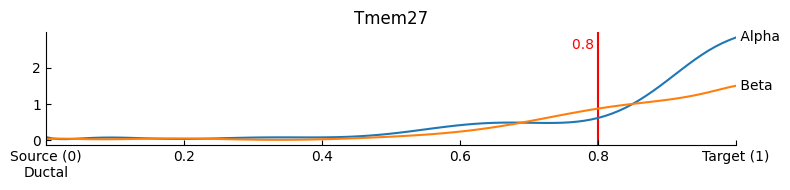

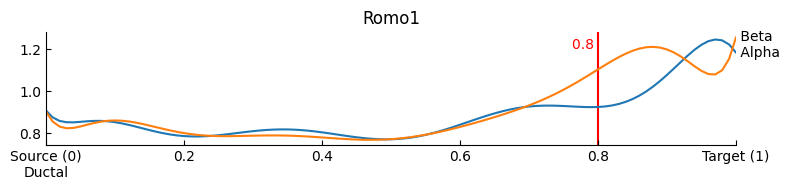

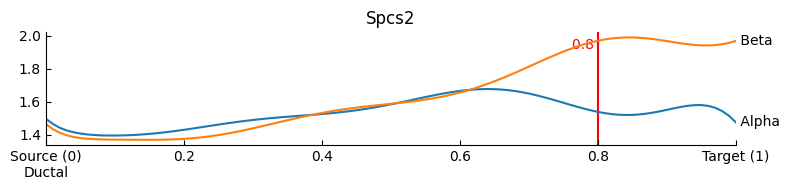

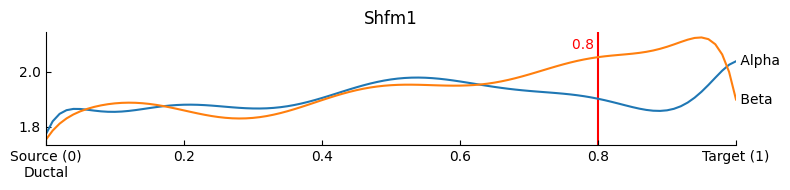

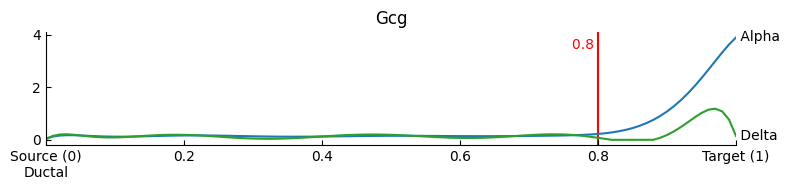

...

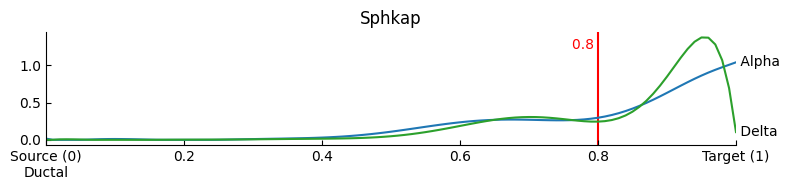

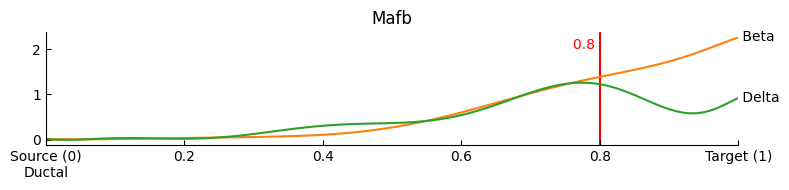

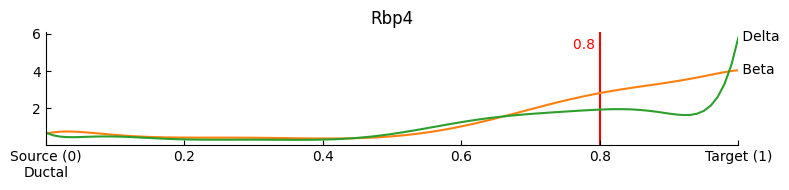

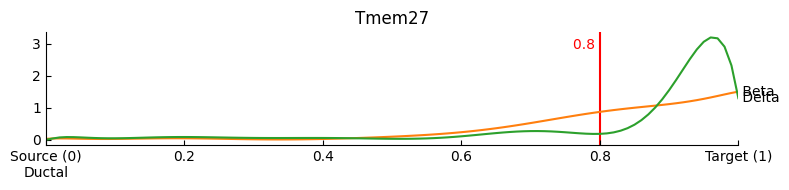

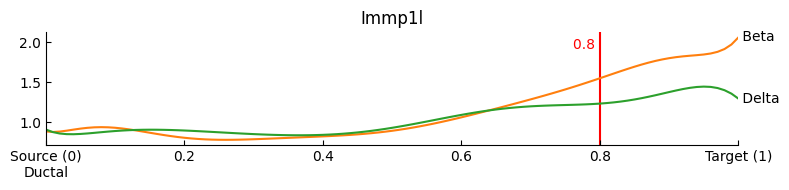

In [ ]:
cellmap.key_gene_dynamics(adata,source_cluster,target_clusters,n_genes=4,time=0.8)

## GRN infernece

In [ ]:
cellmap.calc_GRN(adata,source_cluster,target_clusters,exp_key='RECODE_log')

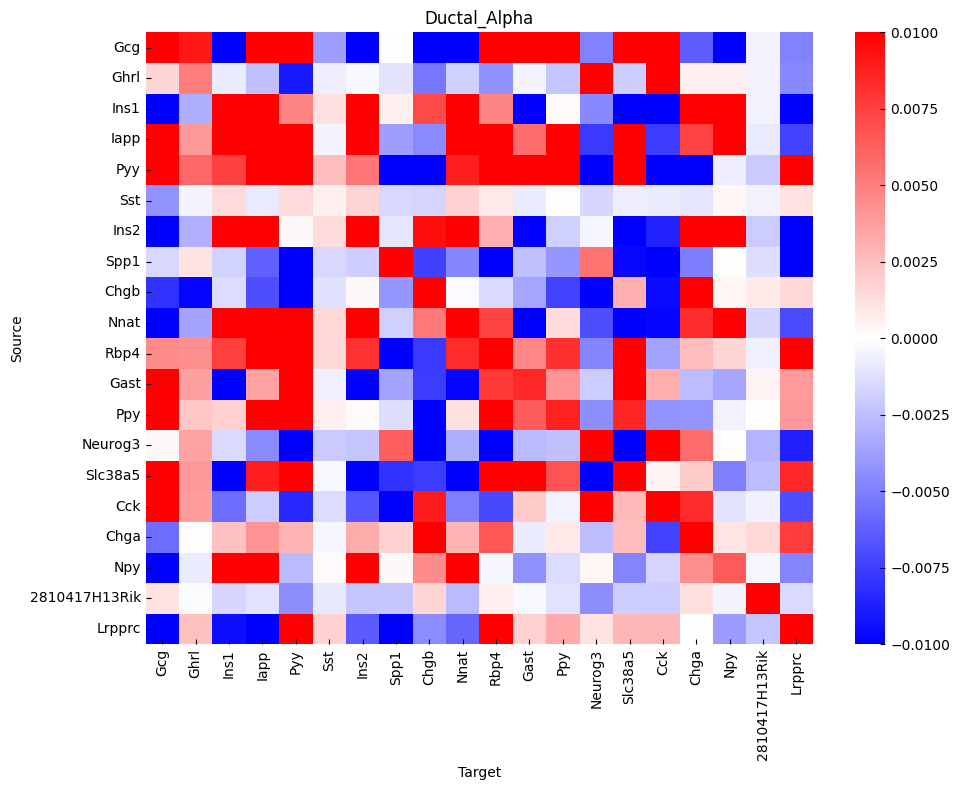

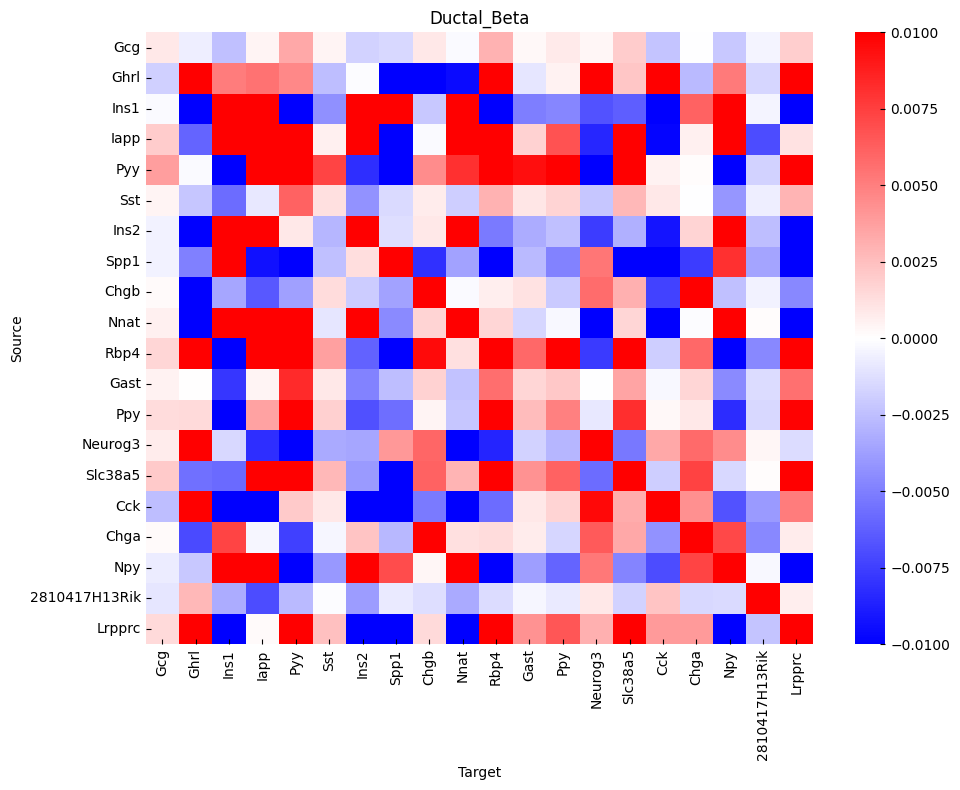

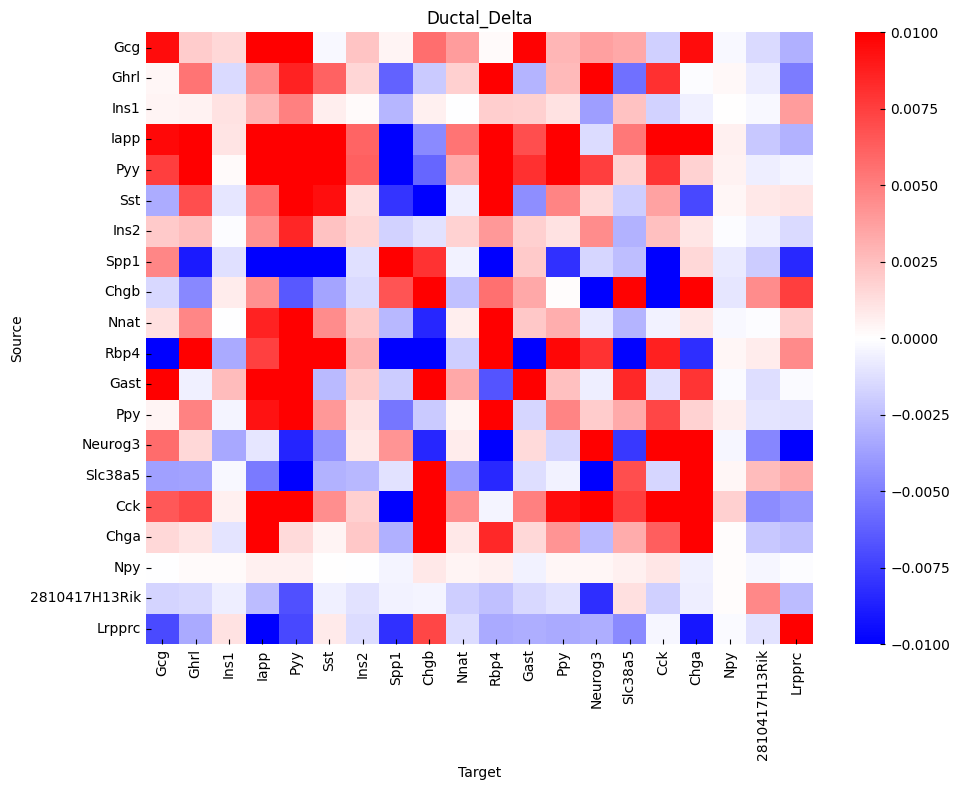

In [ ]:
cellmap.view_GRN(adata,source_cluster,target_clusters,exp_key='RECODE_log')